# Import and initialize stuff

Additionally, here is the baseline DSA-2000 specs from the [DSA-2000 white paper](https://sites.astro.caltech.edu/~vikram/DSA_2000__Specifications.pdf):

| **Quantity**                          | **Value**                                                                 |
|---------------------------------------|---------------------------------------------------------------------------|
| **Reflectors**                        | 2000 × 5-m dishes                                                        |
| **Frequency Coverage**                | 0.7–2 GHz                                                                |
| **Bandwidth**                         | 1.3 GHz                                                                  |
| **Field of View**                     | 10.6 deg²                                                                |
| **Spatial Resolution**                | 3.5″                                                                     |
| **System Temperature**                | 25 K                                                                     |
| **Aperture Efficiency**               | 70%                                                                      |
| **System-equivalent flux density (SEFD)** | 2.5 Jy                                                                 |
| **Survey Speed Figure of Merit**      | 1.3 × 10⁷ deg² m⁴ K⁻²                                                   |
| **Continuum Sensitivity (1 hour)**    | 1 μJy                                                                    |
| **All-Sky Survey (per epoch)**        | 30,000 deg² @ 2 μJy/bm                                                  |
| **All-Sky Survey (combined)**         | 30,000 deg² @ 500 nJy/beam                                              |
| **Pulsar Timing Fields**              | 2000 deg² @ 200 nJy/beam                                                |
| **Deep Drilling Fields**              | 30 deg² @ 100 nJy/beam                                                  |
| **Brightness Temperature (1σ)**       | 5 mK                                                                     |
| **Number of Unique Sources**          | > 1 billion                                                              |

*Sensitivity calculations assume 65% usable bandwidth and 20% time loss to overheads. The field of view assumes a standard illumination taper.*

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import random
from skimage.metrics import peak_signal_noise_ratio as psnr 
from concurrent.futures import ThreadPoolExecutor
# from scipy.ndimage import zoom
from skimage.transform import rescale
import time

np.random.seed(2048)
DSA_2000_ANTENNA_DIAMETER_KM = 5e-3 # km

DSA_2000_MAX_RADIUS_KM = 15

DSA_2000_MIN_FREQUENCY_GHZ = 0.7
DSA_2000_MAX_FREQUENCY_GHZ = 2

DSA_2000_MIN_FREQUENCY_HZ = 0.7e9
DSA_2000_MAX_FREQUENCY_HZ = 2e9

DSA_2000_NPIX = 1024

c = 299792 # km/s

DSA_2000_MIN_WAVELENGTH_KM = c / DSA_2000_MAX_FREQUENCY_HZ
DSA_2000_MAX_WAVELENGTH_KM = c / DSA_2000_MIN_FREQUENCY_HZ
DSA_2000_MIN_WAVELENGTH_KM, DSA_2000_MAX_WAVELENGTH_KM

DSA_2000_MAX_BASELINE_KM = 2 * DSA_2000_MAX_RADIUS_KM
DSA_2000_MAX_UV_EXTENT = DSA_2000_MAX_BASELINE_KM / DSA_2000_MIN_WAVELENGTH_KM
DSA_2000_UV_SCALE_FACTOR = DSA_2000_NPIX / (2*DSA_2000_MAX_UV_EXTENT) # Assume the UV plane is normalized to [-npix/2, npix/2]

In [2]:
# To stop VERY time (and space) consuming cells from running
# Only switch to True if you want to regenerate some or all of the data
REGENERATE_DATA = False

# Preview clean true sky images

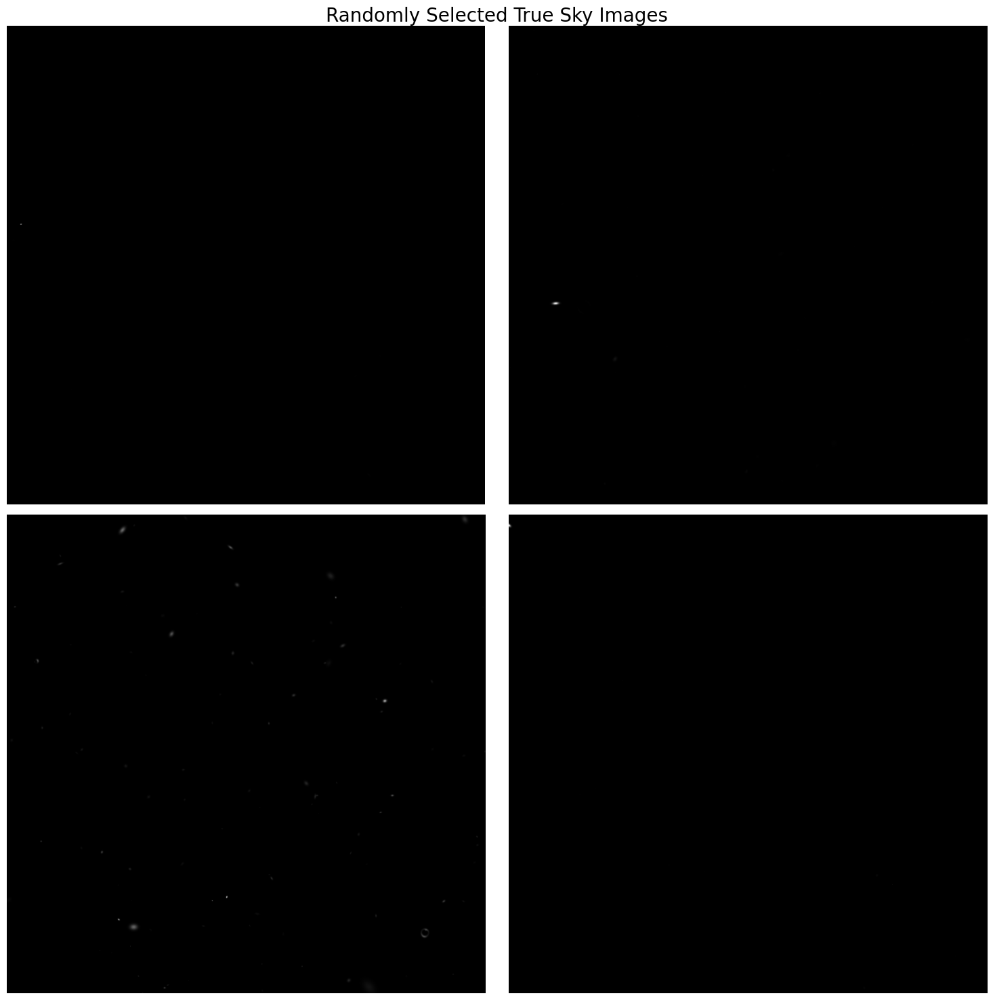

In [3]:
def load_random_images(image_folder, n, m):
    image_files = [os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith('.npy')]
    selected_files = random.sample(image_files, n * m)  # Randomly select n * m images
    images = [np.load(file) for file in selected_files]
    return images

def plot_image_grid(images, n, m, figsize=(15, 15)):
    fig, axes = plt.subplots(n, m, figsize=figsize)
    fig.suptitle("Randomly Selected True Sky Images", fontsize=20)

    for i, ax in enumerate(axes.flat):
        if i < len(images):
            ax.imshow(images[i], cmap='gray')
            ax.axis('off')
        else:
            ax.remove()  # Remove empty axes for any extra grid cells
    
    plt.tight_layout()
    plt.show()

image_folder = './POLISH_train_HR'  # tRue sky images
n, m = 2, 2 

# Load and plot images
images = np.array(load_random_images(image_folder, n, m))
plot_image_grid(images, n, m)

In [4]:
print(f"Image shape: {images[0].shape}")
print(f"Images min: {images.min()}")
print(f"Images max: {images.max()}") # Max flux per pixel is 16-bit integer (65535) (units of 1e-7 Jy?)

Image shape: (1024, 1024, 1)
Images min: 0.0
Images max: 6911.758386873588


# Preview POLISH's dirty (LR) images

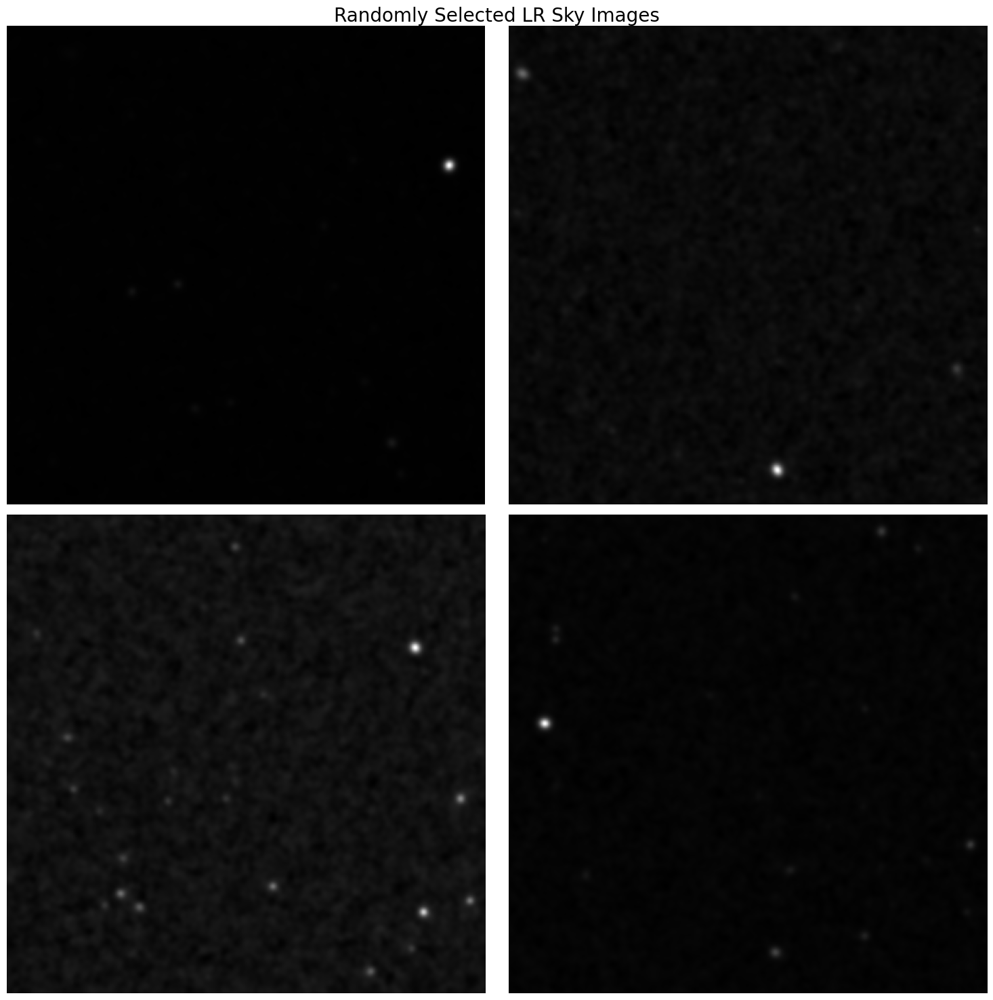

In [5]:
def load_random_images(image_folder, n, m):
    image_files = [os.path.join(image_folder, f) for f in os.listdir(image_folder) if f.endswith('.npy')]
    selected_files = random.sample(image_files, n * m)  # Randomly select n * m images
    images = [np.load(file) for file in selected_files]
    return images

def plot_image_grid(images, n, m, figsize=(15, 15)):
    fig, axes = plt.subplots(n, m, figsize=figsize)
    fig.suptitle("Randomly Selected LR Sky Images", fontsize=20)

    for i, ax in enumerate(axes.flat):
        if i < len(images):
            ax.imshow(images[i], cmap='gray')
            ax.axis('off')
        else:
            ax.remove()  # Remove empty axes for any extra grid cells
    
    plt.tight_layout()
    plt.show()

image_folder = './POLISH_train_LR_bicubic/X2'  # dirty image
n, m = 2, 2 

# Load and plot images
images = np.array(load_random_images(image_folder, n, m))
plot_image_grid(images, n, m)


In [6]:
print(f"Image shape: {images[0].shape}")
print(f"Images min: {images.min()}") # Min ~ 0
print(f"Images max: {images.max()}") # Max = 1

Image shape: (512, 512, 1)
Images min: 1.4299594969046647e-05
Images max: 1.0


# Preview PSF used for POLISH LR images

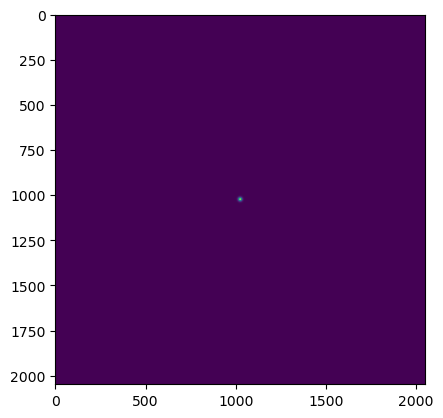

In [7]:
psf = np.load("./psf/psf_ideal.npy")
plt.imshow(psf)

# Generate and save UV pattern

Based on this tutorial: https://nbviewer.org/github/ratt-ru/ratt-interferometry-course/blob/master/ipython-notebooks/aperture-synthesis.ipynb
Additional reading:
- https://github.com/ratt-ru/fundamentals_of_interferometry/blob/21d7754b273373adf161306f34aa920506d766a5/5_Imaging/5_2_sampling_functions_and_psfs.ipynb
- https://github.com/ratt-ru/fundamentals_of_interferometry/blob/master/5_Imaging/5_1_spatial_frequencies.ipynb

In [8]:
def generate_random_antennas(num_antennas, max_radius=15):
    """
    Generate random antenna positions within a circular area.
    
    inputs:
        num_antennas (int): Number of antennas.
        max_radius (float): Radius of the circular area in kilometers.
        
    outputs:
        antenna_positions (ndarray): Antenna positions (x, y) in kilometers.
    """
    # Random points in polar coorsd
    r = max_radius * np.sqrt(np.random.uniform(0, 1, num_antennas))
    r = np.clip(r, 0, max_radius)  # Ensure r <= max_radius
    theta = np.random.uniform(0, 2 * np.pi, num_antennas)
    
    # polar to Cartesian coords
    x = r * np.cos(theta)
    y = r * np.sin(theta)
    
    # SANITY CHECK: Check for points outside the circle
    max_r_calculated = np.sqrt(x**2 + y**2).max()
    assert max_r_calculated <= max_radius, f"Point outside the circle detected: r = {max_r_calculated:.2f} km"

    return np.stack((x, y), axis=1)

def compute_uv_coverage(antenna_positions, wavelength):
    """
    Compute UV coverage from antenna positions.
    
    inputs:
        antenna_positions (ndarray): Antenna positions (x, y) in kilometers.
        wavelength (float): Wavelength in kilometers. This scales the baseline to UV coordinates.
        
    outputs:
        uv_points (ndarray): UV coverage points (u, v).
    """
    num_antennas = len(antenna_positions)
    uv_points = []
    max_baseline_magnitue = -9999999
    min_baseline_magnitude = 9999999
    # pairwise baselines
    for i in range(num_antennas):
        for j in range(i + 1, num_antennas):
            baseline = antenna_positions[j] - antenna_positions[i]
            uv_point = baseline / wavelength
            uv_points.append(uv_point)
            
            baseline_magnitude = np.sqrt(baseline.dot(baseline))
            if baseline_magnitude > max_baseline_magnitue:
                max_baseline_magnitue = baseline_magnitude
                
            if baseline_magnitude < min_baseline_magnitude:
                min_baseline_magnitude = baseline_magnitude
#             uv_points.append(-uv_point)  # conjugate (u, v) point # Note: Ignore this, will be handled when generating mask
    return np.array(uv_points), min_baseline_magnitude, max_baseline_magnitue


def create_uv_mask(image_shape, uv_points, uv_scale=1.0):
    """
    Create a binary UV mask based on UV points for a given Fourier grid shape.
    
    inputs:
        image_shape (tuple): Shape of the Fourier grid (ny, nx).
        uv_points (ndarray): UV coverage points (u, v) in wavelengths.
        uv_scale (float): Scaling factor for UV points to fit on grid.
        
    outputs:
        uv_mask (ndarray): Binary UV mask for the Fourier domain.
    """
    ny, nx = image_shape
    center_y, center_x = ny // 2, nx // 2
    uv_mask = np.zeros((ny, nx), dtype=int)
    
    for u, v in uv_points:
        u_idx = int(np.round(center_x + np.ceil(u * uv_scale)))
        v_idx = int(np.round(center_y + np.ceil(v * uv_scale)))
        
        u_idx_conj = int(np.round(center_x - np.ceil(u * uv_scale)))
        v_idx_conj = int(np.round(center_y - np.ceil(v * uv_scale)))
        
        # Check bounds
        if 0 <= u_idx < nx and 0 <= v_idx < ny:
            uv_mask[v_idx, u_idx] = 1
        if 0 <= u_idx_conj < nx and 0 <= v_idx_conj < ny:
            uv_mask[v_idx_conj, u_idx_conj] = 1
    
    return uv_mask

def compute_uv_scale(image_shape):
    """
    Compute the UV scaling factor to map UV coordinates to Fourier grid indices.
    """
    ny, nx = image_shape
    return min(nx, ny) / (2 * DSA_2000_MAX_UV_EXTENT)


def calculate_psnr(img1, img2):
    """
    Basoc PSNR compute.
    """
    return psnr(img1, img2, data_range=img1.max() - img1.min())


def normalize_image(img):
    return (img - img.min()) / (img.max() - img.min())

def plot_uv_coverage(uv_points, wavelength_km=1):
    """
    Plot the UV coverage.
    """
    uv_points_normalized = uv_points
    plt.figure(figsize=(8, 8))
    plt.scatter(uv_points_normalized[:, 0], uv_points_normalized[:, 1], s=5, color='blue', alpha=0.8, label="UV Points")
    plt.scatter(-uv_points_normalized[:, 0], -uv_points_normalized[:, 1], s=5, color='red', alpha=0.8, label="Conjugate UV Points")
    plt.axhline(0, color='gray', linewidth=0.5, linestyle='--')
    plt.axvline(0, color='gray', linewidth=0.5, linestyle='--')
    plt.xlabel("u (wavelengths)")
    plt.ylabel("v (wavelengths)")
    plt.title("UV Coverage")
    plt.legend()
    plt.axis('equal')
    plt.grid(True, alpha=0.3)
    plt.show()

## Test an example with 2 antennas

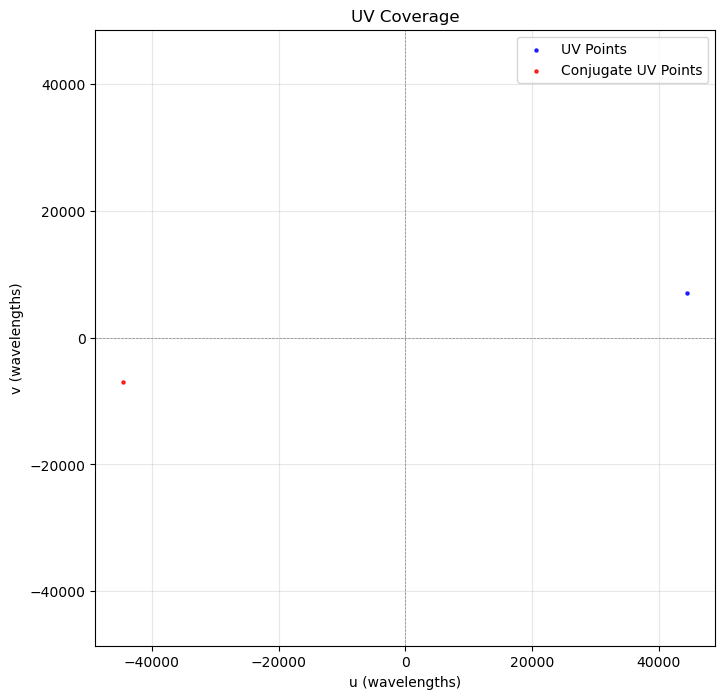

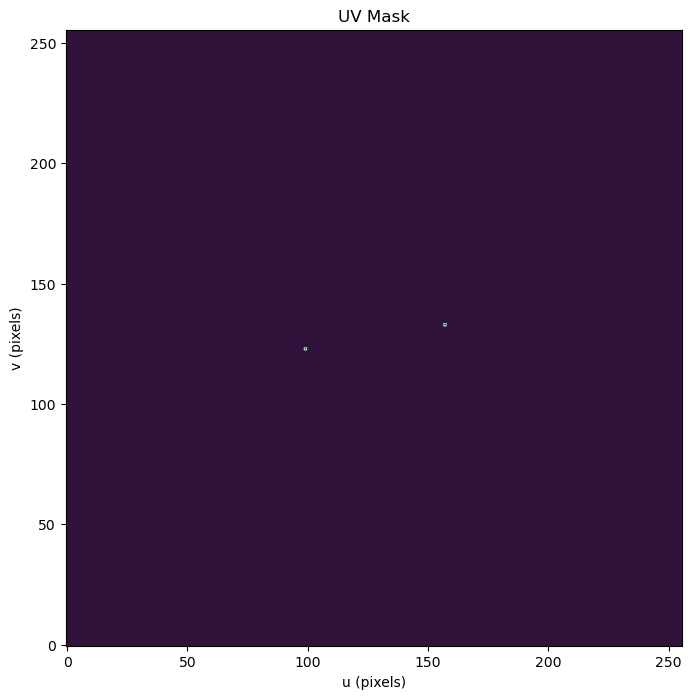

In [13]:
# Parameters
num_antennas = 2
max_radius_km = 15  # Max radius(km) for antenna positions

freq = 1.3e9 
wavelength_km = c / freq
# wavelength_km = DSA_2000_MAX_WAVELENGTH_KM
# wavelength_scaled = speed_of_light_km_per_s / frequency_resolution
image_shape = (256, 256)

antenna_positions = generate_random_antennas(num_antennas, max_radius=max_radius_km)
uv_points, min_baseline, max_baseline = compute_uv_coverage(antenna_positions, wavelength_km)
uv_scale = compute_uv_scale(image_shape) 

# Generate UV mask (grid sampling with points takes too long per image - use mask for speed)
uv_mask = create_uv_mask(image_shape, uv_points, uv_scale=uv_scale)

plot_uv_coverage(uv_points, wavelength_km)
plt.figure(figsize=(8, 8))
plt.imshow(uv_mask, cmap='turbo', origin='lower')
plt.title("UV Mask")
plt.xlabel("u (pixels)")
plt.ylabel("v (pixels)")
plt.show()


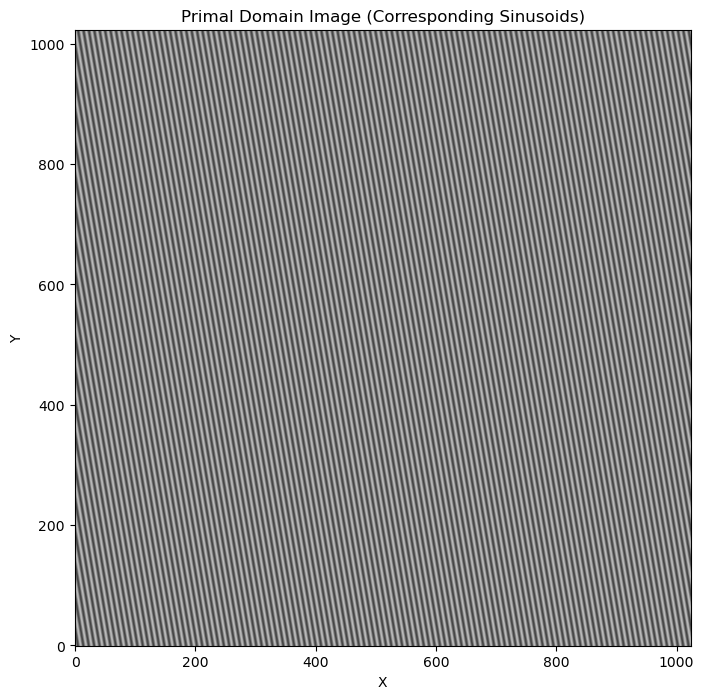

In [15]:
def generate_primal_domain_image(uv_points, image_shape, uv_scale):
    """
    ONLY FOR SANITY CHECK.
    Generate a primal domain image based on the UV points.
    """
    ny, nx = image_shape
    center_y, center_x = ny // 2, nx // 2
    fft_image = np.zeros((ny, nx), dtype=complex)
    amplitude = 1.0  # Amplitude of sin
    
    for u, v in uv_points:
        u_idx = int(np.round(center_x + np.ceil(u * uv_scale)))
        v_idx = int(np.round(center_y + np.ceil(v * uv_scale)))
        
        if 0 <= u_idx < nx and 0 <= v_idx < ny:
            fft_image[v_idx, u_idx] = amplitude
            
            # conjugate point 
            fft_image[center_y - (v_idx), center_x - (u_idx)] = amplitude
    
    primal_image = np.real(np.fft.ifft2(np.fft.ifftshift(fft_image)))
    return primal_image

image_shape = (1024, 1024) 
uv_scale = compute_uv_scale(image_shape)

primal_image = generate_primal_domain_image(uv_points, image_shape, uv_scale)

plt.figure(figsize=(8, 8))
plt.imshow(primal_image, cmap='gray', origin='lower')
plt.title("Primal Domain Image (Corresponding Sinusoids)")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

## Generate UV coverages and masks to use for synthesizing data (Takes ~5-10 minutes for 2048 antennas)


Processing 1300000000.0 Hz...

Processing 8 antennas...

Processing 16 antennas...

Processing 32 antennas...

Processing 64 antennas...

Processing 128 antennas...

Processing 256 antennas...

Processing 512 antennas...

Processing 1024 antennas...

Processing 2048 antennas...


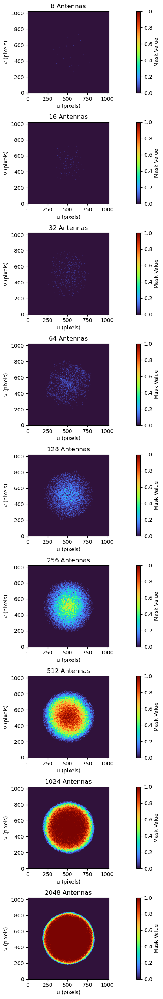

In [16]:
# assert REGENERATE_DATA, "Not in data generation mode. Stopping this cell from wasting your time..."

# check output directory exists
output_dir_points = "./synthetic_data/uv/"
os.makedirs(output_dir_points, exist_ok=True)
np.random.seed(2048)
# params
antenna_counts = [8, 16, 32, 64, 128, 256, 512, 1024, 2048]
max_radius_km = 15
# frequencies_hz = [10e6, 0.7e9, 1.3e9, 2e9]
frequencies_hz = [1.3e9]

image_shape = (1024, 1024)
scaling_factors = [1,2,3,4]

# for plots
uv_masks = []
uv_titles = []

for frequency_hz in frequencies_hz:
    print(f"\nProcessing {frequency_hz} Hz...")
    wavelength_km = c / frequency_hz
    for num_antennas in antenna_counts:
        print(f"\nProcessing {num_antennas} antennas...")

        # Generate antennas and UV coverage
        antenna_positions = generate_random_antennas(num_antennas, max_radius=max_radius_km)
        uv_points, min_baseline, max_baseline = compute_uv_coverage(antenna_positions, wavelength_km)

        for s in scaling_factors:
            scaled_image_shape = (image_shape[0]//s,image_shape[1]//s) 
            uv_scale = compute_uv_scale(scaled_image_shape) 
            # Generate UV mask
            uv_mask = create_uv_mask(scaled_image_shape, uv_points, uv_scale=uv_scale)

            # Save UV points and mask
            np.save(f"{output_dir_points}/points_{num_antennas}antennas_{int(frequency_hz * 1e-6)}MHz.npy", uv_points)
            np.save(f"{output_dir_points}/mask_{num_antennas}antennas_{int(frequency_hz * 1e-6)}MHz_downscaled{s}x.npy", uv_mask)

            # for plots
            if s == 1:
                uv_masks.append(uv_mask)
        uv_titles.append(f"{num_antennas} Antennas")

num_plots = len(antenna_counts)
plt.figure(figsize=(15, 3 * num_plots))
for i, (uv_mask, title) in enumerate(zip(uv_masks, uv_titles)):
    plt.subplot(num_plots, 1, i + 1)
    plt.imshow(uv_mask, cmap='turbo', origin='lower')
    plt.title(title)
    plt.xlabel("u (pixels)")
    plt.ylabel("v (pixels)")
    plt.colorbar(label="Mask Value")
plt.tight_layout()
plt.show()

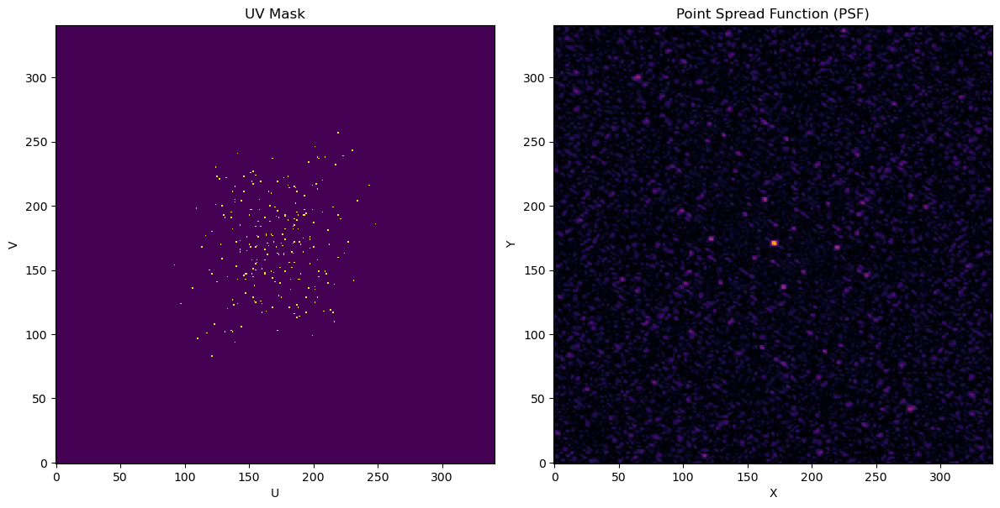

In [18]:
output_dir = "./synthetic_data/uv/"
num_antennas = 16
frequency_hz = 1.3e9 # one of [10e6, 0.7e9, 1.3e9, 2e9]
s = 3
uv_mask_path = f"{output_dir}/mask_{num_antennas}antennas_{int(frequency_hz * 1e-6)}MHz_downscaled{s}x.npy"
uv_mask = np.load(uv_mask_path)  # Load UV mask

psf = np.fft.ifftshift(np.fft.ifft2(np.fft.fftshift(uv_mask)))
psf = np.abs(psf)
psf /= psf.max()

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Plot UV mask
axes[0].imshow(uv_mask, cmap='viridis', origin='lower', interpolation='none')
axes[0].set_title("UV Mask")
axes[0].set_xlabel("U")
axes[0].set_ylabel("V")

# Plot PSF
axes[1].imshow(psf, cmap='inferno', origin='lower', interpolation='none')
axes[1].set_title("Point Spread Function (PSF)")
axes[1].set_xlabel("X")
axes[1].set_ylabel("Y")

plt.tight_layout()
plt.show()

## Dirty images test with some examples (no noise)

In [19]:
# Precompute mask indices - Significantly faster than using the entire mask!
def precompute_uv_mask_indices(uv_mask):
    """
    Precompute the indices of non-zero elements in the UV mask.
    
    Assumption: The mask is binary and no values inbetween 0-1.

    inputs:
        uv_mask (ndarray): The UV mask.

    outputs:
        indices (tuple): Indices of non-zero elements.
    """
    indices = np.nonzero(uv_mask)  # Only get non-zero indices
    return indices


def apply_uv_mask(fft_image, uv_indices):
    """
    Apply the UV mask using precomputed indices.

    inputs:
        fft_image (ndarray): The FFT of the image to be masked.
        uv_indices (tuple): Precomputed indices of the UV mask.

    outputs:
        masked_fft (ndarray): The masked FFT image.
    """
    masked_fft = np.zeros_like(fft_image, dtype=fft_image.dtype)
    masked_fft[uv_indices] = fft_image[uv_indices]
    return masked_fft

def downscale_image(image, scale_factor):
    """
    Downscale an image using bicubic interpolation.
    
    inputs:
        image (ndarray): Input image.
        scale_factor (float): Factor by which to downscale the image.
        
    outputs:
        downscaled_image (ndarray): Downscaled image.
    """
    return rescale(image, 1 / scale_factor, order=3) 

# process a single image
def process_image_with_precomputed_mask(true_sky, uv_indices):
    """
    Process a singel true sky image using the precomputed UV mask

    inputs:
        true_sky (ndarray): True sky image.
        uv_indices (tuple): Precomputed UV mask indices.

    outputs:
        fft_image (ndarray): FFT of the true sky.
        masked_fft (ndarray): Masked FFT.
        dirty_image (ndarray): Dirty image after applying the mask and inverse FFT.
    """
    fft_image = np.fft.fftshift(np.fft.fft2(true_sky))  # F(I_sky)

    masked_fft = apply_uv_mask(fft_image, uv_indices)  # F(I_sky) . S
    dirty_image = np.real(np.fft.ifft2(np.fft.ifftshift(masked_fft)))  # I_d

    return fft_image, masked_fft, dirty_image

In [23]:
output_dir = "./synthetic_data/uv/"
true_sky_dir = "./POLISH_train_HR/"
antenna_counts = [8, 16, 32, 64, 128, 256, 512, 1024, 2048]
s = 3 # downscale factor
max_radius_km = 15
num_images = 1  # Number of test images 
frequency_hz = 1.3e9

# For plots
results = {antenna_count: {"true_sky": [], "original_fft": [], "masked_fft": [], "dirty_image": []}
           for antenna_count in antenna_counts}

# Load true sky images
print("Loading true sky images...")
image_files = sorted([f for f in os.listdir(true_sky_dir) if f.endswith(".npy")])[:num_images]
true_sky_images = [np.load(os.path.join(true_sky_dir, image_file)).squeeze() for image_file in image_files]
true_sky_images_downscaled = [downscale_image(np.load(os.path.join(true_sky_dir, image_file)).squeeze(), s) for image_file in image_files]
print(f"Loaded {len(true_sky_images)} true sky images.")


for antenna_count in antenna_counts:
    print(f"\nProcessing {antenna_count} antennas...")
    uv_mask_path = f"{output_dir}/mask_{antenna_count}antennas_{int(frequency_hz * 1e-6)}MHz_downscaled{s}x.npy"
    uv_mask = np.load(uv_mask_path)  # Load UV mask
    print(f"{output_dir}/mask_{antenna_count}antennas_{int(frequency_hz * 1e-6)}MHz_downscaled{s}x.npy")

    # Precompute mask indices
    uv_indices = precompute_uv_mask_indices(uv_mask)

    with ThreadPoolExecutor() as executor:
        futures = []
        for idx, true_sky in enumerate(true_sky_images_downscaled):
            start_time = time.time()  # Start timing
            futures.append(
            executor.submit(process_image_with_precomputed_mask, 
                                true_sky, uv_indices)
            )
            elapsed_time = time.time() - start_time  # Calculate elapsed time
            print(f"  Image {idx + 1}/{num_images} for {antenna_count} antennas took {elapsed_time:.4f} seconds")

        for idx, future in enumerate(futures):
            fft_image, masked_fft, dirty_image = future.result()
            results[antenna_count]["true_sky"].append(true_sky_images[idx])
            results[antenna_count]["original_fft"].append(fft_image)
            results[antenna_count]["masked_fft"].append(masked_fft)
            results[antenna_count]["dirty_image"].append(dirty_image)


Loading true sky images...
Loaded 1 true sky images.

Processing 8 antennas...
./synthetic_data/uv//mask_8antennas_1300MHz_downscaled3x.npy
  Image 1/1 for 8 antennas took 0.0006 seconds

Processing 16 antennas...
./synthetic_data/uv//mask_16antennas_1300MHz_downscaled3x.npy
  Image 1/1 for 16 antennas took 0.0005 seconds

Processing 32 antennas...
./synthetic_data/uv//mask_32antennas_1300MHz_downscaled3x.npy
  Image 1/1 for 32 antennas took 0.0005 seconds

Processing 64 antennas...
./synthetic_data/uv//mask_64antennas_1300MHz_downscaled3x.npy
  Image 1/1 for 64 antennas took 0.0006 seconds

Processing 128 antennas...
./synthetic_data/uv//mask_128antennas_1300MHz_downscaled3x.npy
  Image 1/1 for 128 antennas took 0.0004 seconds

Processing 256 antennas...
./synthetic_data/uv//mask_256antennas_1300MHz_downscaled3x.npy
  Image 1/1 for 256 antennas took 0.0006 seconds

Processing 512 antennas...
./synthetic_data/uv//mask_512antennas_1300MHz_downscaled3x.npy
  Image 1/1 for 512 antennas to


Plotting results...


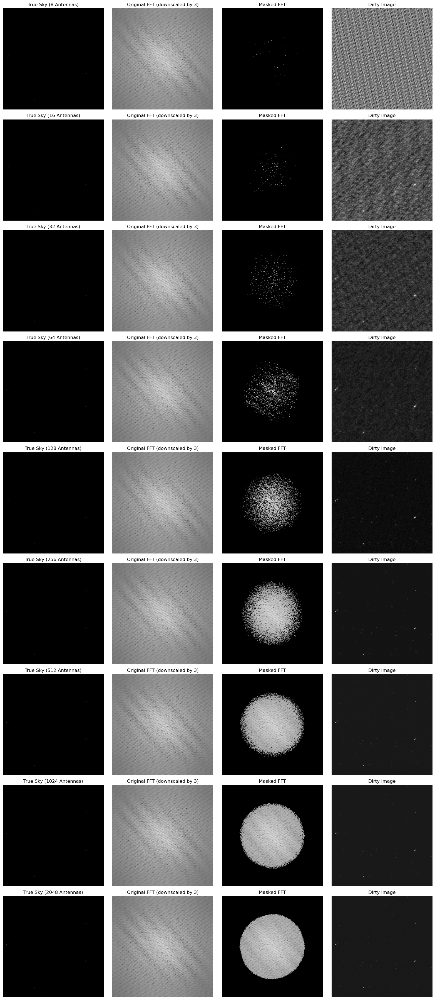

Processing and plotting completed.


In [25]:
# Plot results
print("\nPlotting results...")
rows = len(antenna_counts)
cols = 4  # True Sky, Original FFT, Masked FFT, Dirty Image
plt.figure(figsize=(16, 4*rows ))
for i, antenna_count in enumerate(antenna_counts):
    for j in range(num_images):
        # True Sky
        plt.subplot(rows * num_images, cols, i * num_images * cols + j * cols + 1)
        plt.imshow(np.abs(results[antenna_count]["true_sky"][j]), cmap="gray", origin="lower")
        plt.title(f"True Sky ({antenna_count} Antennas)")
        plt.axis("off")

        # Original FFT
        plt.subplot(rows * num_images, cols, i * num_images * cols + j * cols + 2)
        plt.imshow(np.log1p(np.abs(results[antenna_count]["original_fft"][j])), cmap="gray", origin="lower")
        plt.title(f"Original FFT (downscaled by {s})")
        plt.axis("off")

        # Masked FFT
        plt.subplot(rows * num_images, cols, i * num_images * cols + j * cols + 3)
        plt.imshow(np.log1p(np.abs(results[antenna_count]["masked_fft"][j])), cmap="gray", origin="lower")
        plt.title("Masked FFT")
        plt.axis("off")

        # Dirty Image
        plt.subplot(rows * num_images, cols, i * num_images * cols + j * cols + 4)
        plt.imshow(results[antenna_count]["dirty_image"][j], cmap="gray", origin="lower")
        plt.title("Dirty Image")
        plt.axis("off")

plt.tight_layout()
plt.show()
print("Processing and plotting completed.")


Loading true sky images...
Loaded 5 true sky images.


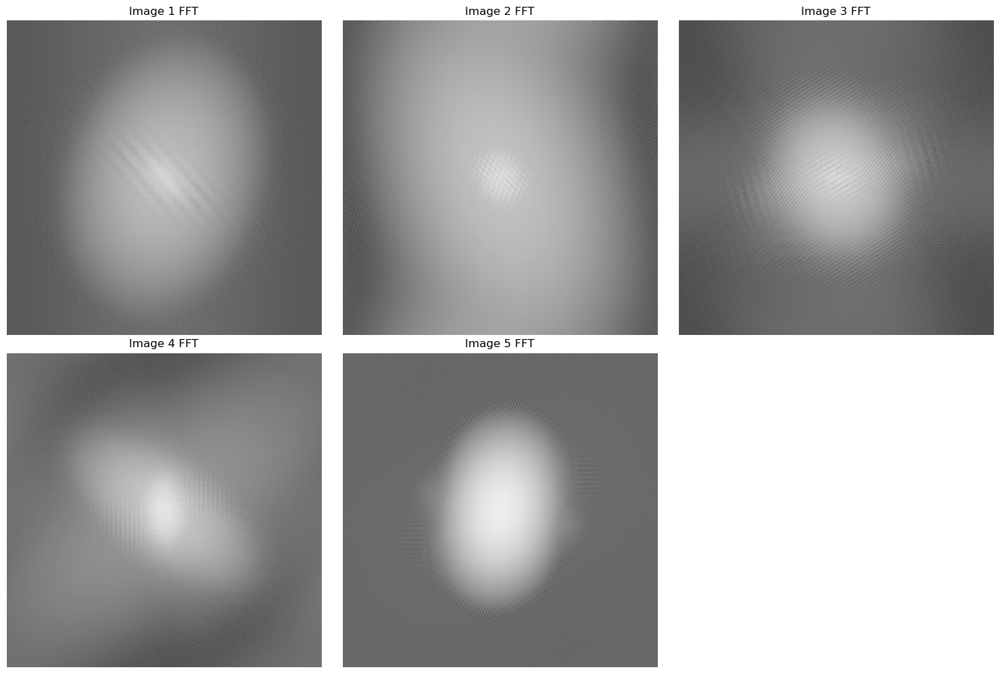

In [27]:
true_sky_dir = "./POLISH_train_HR/"
num_images = 5 
print("Loading true sky images...")
image_files = sorted([f for f in os.listdir(true_sky_dir) if f.endswith(".npy")])[:num_images]
true_sky_images = [np.load(os.path.join(true_sky_dir, image_file)).squeeze() for image_file in image_files]
print(f"Loaded {len(true_sky_images)} true sky images.")

plt.figure(figsize=(15, 10))
for idx, true_sky in enumerate(true_sky_images):
    fft_image = np.fft.fftshift(np.fft.fft2(true_sky))
    fft_magnitude = np.log1p(np.abs(fft_image))
    plt.subplot(2, 3, idx + 1)
    plt.imshow(fft_magnitude, cmap="gray", origin="lower")
    plt.title(f"Image {idx + 1} FFT")
    plt.axis("off")

plt.tight_layout()
plt.show()

## Test to generate images with measurement noise
Generate dirty images with measurement noise added to the true sky image before applying sampling function.
[POLISH paper](https://arxiv.org/pdf/2111.03249) and the [code](https://github.com/liamconnor/polish-pub/blob/main/make_img_pairs.py) described adding noise to $I_sky$ before sampling and downscaling:
> Before applying the PSF kernel to obtain $I_d$, zero-mean i.i.d. Gaussian noise with a standard deviation $\sigma_{sky}$ is applied
to mimic $n_{sky}$. The convolved image is then downsampled by a factor $s$.

In the code, line 117:
```python
if noise:
    data_noise = data + np.random.normal(0,5,data.shape)
```

Using the code, we get noisy images in `./POLISH_train_HR_Noise` whose pixel values are in units of mJy, and the noise is $5$

Here, since we also need to use the visibilities for training, we downscale the original image before adding noise and applying sampling function. Which differs from POLISH paper where they only downsampled the dirty image.


In [28]:
output_dir = "./synthetic_data/uv/"
true_sky_dir = "./POLISH_train_HR/" # Use noisy true sky
true_sky_noise_dir = "./POLISH_train_HR_Noise/" # Use noisy true sky
antenna_counts = [8, 16, 32, 64, 128, 256, 512, 1024, 2048]
max_radius_km = 15
frequency_hz = 1.3e9 # Hz
num_images = 5 
s = 3 # downscale factor = 3 for DSA (=2 for VLA)

results = {antenna_count: {"true_sky": [], "true_sky_noisy": [], "original_fft": [], "masked_fft": [], "dirty_image": []}
           for antenna_count in antenna_counts}

print("Loading true sky images...")
image_files = sorted([f for f in os.listdir(true_sky_dir) if f.endswith(".npy")])[:num_images]
true_sky_images = [np.load(os.path.join(true_sky_dir, image_file)).squeeze() for image_file in image_files]

noisy_image_files = sorted([f for f in os.listdir(true_sky_noise_dir) if f.endswith(".npy")])[:num_images]
true_sky_noisy_images = [np.clip(
        np.load(os.path.join(true_sky_noise_dir, image_file)).squeeze(), 
        a_min=0, a_max=None
    ) for image_file in noisy_image_files]
true_sky_noisy_images_downscaled = [downscale_image(image,s) for image in true_sky_noisy_images]
print(f"Loaded {len(true_sky_images)} true sky images and {len(true_sky_images_downscaled)} and downsampled by {s}.")

# all images and antenna counts
for antenna_count in antenna_counts:
    print(f"\nProcessing {antenna_count} antennas...")
    uv_mask_path = f"{output_dir}/mask_{antenna_count}antennas_{int(frequency_hz * 1e-6)}MHz_downscaled{s}x.npy"
    uv_mask = np.load(uv_mask_path) 
    print(f"{output_dir}/mask_{antenna_count}antennas_{int(frequency_hz * 1e-6)}MHz_downscaled{s}x.npy")

    uv_indices = precompute_uv_mask_indices(uv_mask)

    with ThreadPoolExecutor() as executor:
        futures = []
        for idx, true_sky_noisy in enumerate(true_sky_noisy_images_downscaled):
            start_time = time.time() 
            futures.append(
            executor.submit(process_image_with_precomputed_mask, 
                                true_sky_noisy, uv_indices)
            )
            elapsed_time = time.time() - start_time
            print(f"  Image {idx + 1}/{num_images} for {antenna_count} antennas took {elapsed_time:.4f} seconds")

        for idx, future in enumerate(futures):
            fft_image, masked_fft, dirty_image = future.result()
            results[antenna_count]["true_sky"].append(true_sky_images[idx])
            results[antenna_count]["true_sky_noisy"].append(true_sky_noisy_images[idx])
            results[antenna_count]["original_fft"].append(fft_image)
            results[antenna_count]["masked_fft"].append(masked_fft)
            results[antenna_count]["dirty_image"].append(dirty_image)


Loading true sky images...
Loaded 5 true sky images and 1 and downsampled by 3.

Processing 8 antennas...
./synthetic_data/uv//mask_8antennas_1300MHz_downscaled3x.npy
  Image 1/5 for 8 antennas took 0.0006 seconds
  Image 2/5 for 8 antennas took 0.0004 seconds
  Image 3/5 for 8 antennas took 0.0004 seconds
  Image 4/5 for 8 antennas took 0.0004 seconds
  Image 5/5 for 8 antennas took 0.0006 seconds

Processing 16 antennas...
./synthetic_data/uv//mask_16antennas_1300MHz_downscaled3x.npy
  Image 1/5 for 16 antennas took 0.0005 seconds
  Image 2/5 for 16 antennas took 0.0004 seconds
  Image 3/5 for 16 antennas took 0.0004 seconds
  Image 4/5 for 16 antennas took 0.0005 seconds
  Image 5/5 for 16 antennas took 0.0005 seconds

Processing 32 antennas...
./synthetic_data/uv//mask_32antennas_1300MHz_downscaled3x.npy
  Image 1/5 for 32 antennas took 0.0006 seconds
  Image 2/5 for 32 antennas took 0.0004 seconds
  Image 3/5 for 32 antennas took 0.0005 seconds
  Image 4/5 for 32 antennas took 0.0

In [ ]:

print("\nPlotting results...")
rows = len(antenna_counts)
cols = 4  # True Sky, Original FFT, Masked FFT, Dirty Image
plt.figure(figsize=(16, rows * 32))
for i, antenna_count in enumerate(antenna_counts):
    for j in range(num_images):
        plt.subplot(rows * num_images, cols, i * num_images * cols + j * cols + 1)
        plt.imshow(np.abs(results[antenna_count]["true_sky_noisy"][j]), cmap="gray", origin="lower")
        plt.title(f"True Sky ({antenna_count} Antennas) + noise")
        plt.axis("off")
        plt.subplot(rows * num_images, cols, i * num_images * cols + j * cols + 2)
        plt.imshow(np.log1p(np.abs(results[antenna_count]["original_fft"][j])), cmap="gray", origin="lower")
        plt.title(f"Original FFT (downscaled by {s})")
        plt.axis("off")
        plt.subplot(rows * num_images, cols, i * num_images * cols + j * cols + 3)
        plt.imshow(np.log1p(np.abs(results[antenna_count]["masked_fft"][j])), cmap="gray", origin="lower")
        plt.title("Masked FFT")
        plt.axis("off")
        plt.subplot(rows * num_images, cols, i * num_images * cols + j * cols + 4)
        plt.imshow(results[antenna_count]["dirty_image"][j], cmap="gray", origin="lower")
        plt.title("Dirty Image")
        plt.axis("off")

plt.tight_layout()
plt.show()
print("Processing and plotting completed.")



Plotting results...


/tmp/ipykernel_328518/3397546844.py:27: RuntimeWarning: invalid value encountered in log1p
  plt.imshow(np.log1p(dirty_image), cmap='turbo', origin='lower')


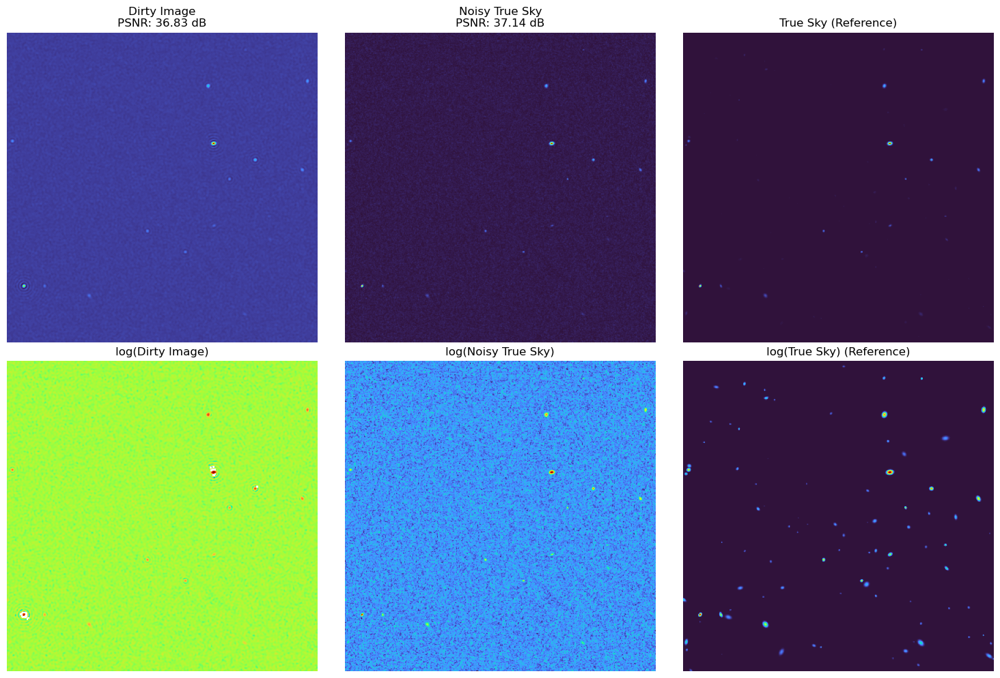

In [16]:
antenna_count = antenna_counts[-1]
image_idx = 3

dirty_image = results[antenna_count]["dirty_image"][image_idx]
true_sky_noisy = rescale(results[antenna_count]["true_sky_noisy"][image_idx], 1/s)
true_sky = rescale(results[antenna_count]["true_sky"][image_idx], 1/s)

psnr_dirty = calculate_psnr(dirty_image, true_sky)
psnr_noisy = calculate_psnr(true_sky_noisy, true_sky)

plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(dirty_image, cmap='turbo', origin='lower')
plt.title(f"Dirty Image\nPSNR: {psnr_dirty:.2f} dB")
plt.axis('off')
plt.subplot(2, 3, 2)
plt.imshow(true_sky_noisy, cmap='turbo', origin='lower')
plt.title(f"Noisy True Sky\nPSNR: {psnr_noisy:.2f} dB")
plt.axis('off')
plt.subplot(2, 3, 3)
plt.imshow(true_sky, cmap='turbo', origin='lower')
plt.title("True Sky (Reference)")
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(np.log1p(dirty_image), cmap='turbo', origin='lower')
plt.title(f"log(Dirty Image)")
plt.axis('off')
plt.subplot(2, 3, 5)
plt.imshow(np.log1p(true_sky_noisy), cmap='turbo', origin='lower')
plt.title(f"log(Noisy True Sky)")
plt.axis('off')
plt.subplot(2, 3, 6)
plt.imshow(np.log1p(true_sky), cmap='turbo', origin='lower')
plt.title("log(True Sky) (Reference)")
plt.axis('off')

plt.tight_layout()
plt.show()


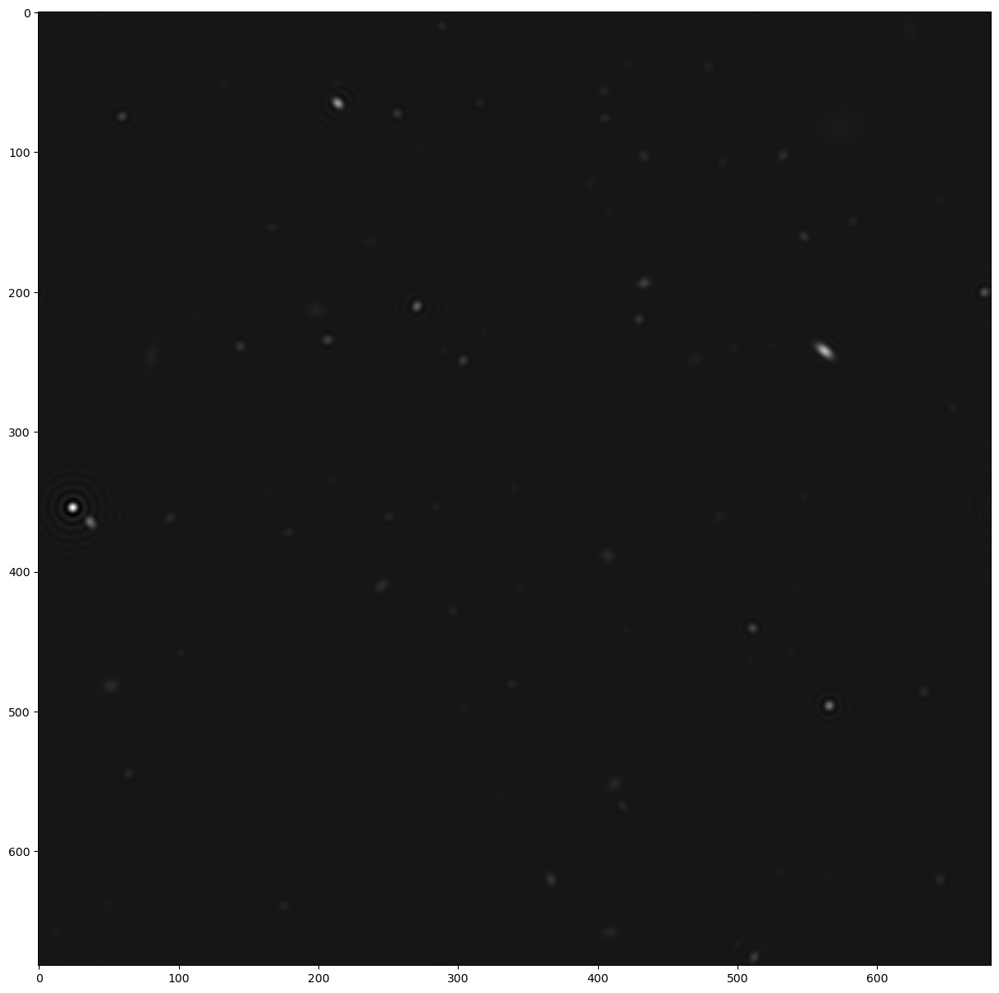

In [26]:
antenna_count = antenna_counts[-1]
image_idx = 0

dirty_image = rescale(results[antenna_count]["dirty_image"][image_idx],2)
plt.figure(figsize=(15, 15))
plt.imshow(dirty_image, cmap='gray')

## Generate the training and validation set
We want the following for our data set:
- True sky image (1024x1024) as labels (done already).
- True sky noisy image (1024x1024) (done already).


Then:
- For each image in training, training noisy and validation, validation noisy sets:
    - Save the following:
        - True sky image visibility (FFT True sky) (original size) as labels (to be computed).
        - True sky noisy image visibility (FFT True sky noisy) (original size) (to be computed).
    - For each `num_antenna` in [32, 128, 512, 2048]:
        - For each downscaling factor `s` in [1,2]:
            - For each frequency `freq` in [10e6, 0.7e9, 1.3e9, 2e9]:
                - Use the saved mask `mask_{antenna_count}antennas_{int(frequency_hz * 1e-6)}MHz_downscaled{s}x.npy`.
                - Downsample the true sky image by `s`, get the visibility.
                - Downsample the true sky noisy image by `s`, get the visibility.
                - Apply loaded saved mask to apply sampling function to the visibilities.
                - Save the following:
                    - Dirty image of from sparsely sampled true sky downsampled visibility.
                    - Dirty image of from sparsely sampled true sky noisy downsampled visibility.

In [21]:
output_dir = "./synthetic_data"
true_sky_dirs = {
    "train": "./POLISH_train_HR/",
    "train_noisy": "./POLISH_train_HR_Noise/",
    "valid": "./POLISH_valid_HR/",
    "valid_noisy": "./POLISH_valid_HR_Noise/",
}
frequencies_hz = [10e6, 0.7e9, 1.3e9, 2e9]  # Frequencies in Hz
antenna_counts = [32, 128, 512, 2048]
scaling_factors = [1, 2]
c = 299792  # Speed of light in km/s

def load_images(folder, num_images=None):
    """
    Load images from a given folder.
    """
    files = sorted([os.path.join(folder, f) for f in os.listdir(folder) if f.endswith(".npy")])
    if num_images:
        files = files[:num_images]
    return [np.load(f) for f in files]

def load_images_with_filenames(folder):
    """
    Load images and their filenames from a folder.
    """
    files = sorted([os.path.join(folder, f) for f in os.listdir(folder) if f.endswith(".npy")])
    return [(np.load(f), os.path.basename(f).replace(".npy", "")) for f in files]

In [22]:
from concurrent.futures import ThreadPoolExecutor, as_completed
import os

MAX_WORKERS = 16  

total_files = sum(
    len(os.listdir(true_sky_dirs[dataset_type])) * len(frequencies_hz) * len(antenna_counts) * len(scaling_factors)
    for dataset_type in ["train", "valid"]
)

# Precomputed UV masks and indices cache
precomputed_masks = {}

def get_precomputed_uv_indices(uv_mask_path):
    """
    Load or retrieve precomputed UV mask indices.
    """
    if uv_mask_path not in precomputed_masks:
        uv_mask = np.load(uv_mask_path)
        uv_indices = precompute_uv_mask_indices(uv_mask)
        precomputed_masks[uv_mask_path] = uv_indices
    return precomputed_masks[uv_mask_path]

# process a single file on thread
def process_single_file(image, filename, noisy_image, noisy_filename, uv_indices, scaling_factor, frequency_name, antenna_count, dataset_type):
    assert filename == noisy_filename.replace("_noise", ""), "Mismatch between true and noisy filenames"

    image = image.squeeze()
    noisy_image = noisy_image.squeeze()
    
    # save path
    save_path = os.path.join(output_dir, f"{dataset_type}/freq_{frequency_name}/antennas_{antenna_count}_s{scaling_factor}")
    os.makedirs(save_path, exist_ok=True)

    file_paths = {
        "fft_full": os.path.join(save_path, f"{filename}_fft_full.npy"),
        "masked_fft_full": os.path.join(save_path, f"{filename}_masked_fft_full.npy"),
        "dirty_image_full": os.path.join(save_path, f"{filename}_dirty_image_full.npy"),
        "noisy_fft_full": os.path.join(save_path, f"{filename}_noisy_fft_full.npy"),
        "noisy_masked_fft_full": os.path.join(save_path, f"{filename}_noisy_masked_fft_full.npy"),
        "noisy_dirty_image_full": os.path.join(save_path, f"{filename}_noisy_dirty_image_full.npy"),
    }

    # Check if all files exist
    if all(os.path.exists(path) for path in file_paths.values()):
        return False  # Skip this file

    # Downscale images
    image_downscaled = downscale_image(image, scaling_factor)
    noisy_image_downscaled = downscale_image(noisy_image, scaling_factor)

    # Process images
    outputs = process_image_with_precomputed_mask(image_downscaled, uv_indices)
    noisy_outputs = process_image_with_precomputed_mask(noisy_image_downscaled, uv_indices)

    # Save outputs
    np.save(file_paths["fft_full"], outputs[0])
    np.save(file_paths["masked_fft_full"], outputs[1])
    np.save(file_paths["dirty_image_full"], outputs[2])

    np.save(file_paths["noisy_fft_full"], noisy_outputs[0])
    np.save(file_paths["noisy_masked_fft_full"], noisy_outputs[1])
    np.save(file_paths["noisy_dirty_image_full"], noisy_outputs[2])
    
    return True  # success

In [23]:
assert REGENERATE_DATA, "Not in data generation mode. Stopping this cell from wasting your time..."

processed_files = 0 
skipped_files = 0 

for dataset_type in ["train", "valid"]:
    print(f"Processing {dataset_type} dataset...")
    
    true_sky_images = load_images_with_filenames(true_sky_dirs[dataset_type])
    true_sky_noisy_images = load_images_with_filenames(true_sky_dirs[f"{dataset_type}_noisy"])
    
    for frequency_hz in frequencies_hz[::-1]:
        frequency_name = f"{int(frequency_hz * 1e-6)}MHz"
        print(f"  Processing frequency {frequency_name}...")

        for antenna_count in antenna_counts:
            print(f"    Processing {antenna_count} antennas...")

            for scaling_factor in scaling_factors:
                print(f"      Processing downscale factor {scaling_factor}...")

                uv_mask_path = f"{output_dir}/uv/mask_{antenna_count}antennas_{frequency_name}_downscaled{scaling_factor}x.npy"
                uv_indices = get_precomputed_uv_indices(uv_mask_path)
                
                # Parallel processing
                with ThreadPoolExecutor(max_workers=MAX_WORKERS) as executor:
                    futures = [
                        executor.submit(
                            process_single_file,
                            image, filename, noisy_image, noisy_filename,
                            uv_indices, scaling_factor, frequency_name, antenna_count, dataset_type
                        )
                        for (image, filename), (noisy_image, noisy_filename) in zip(true_sky_images, true_sky_noisy_images)
                    ]

                    for future in as_completed(futures):
                        if future.result():  # If file was processed
                            processed_files += 1
                        else:  # If file was skipped
                            skipped_files += 1
                            processed_files += 1
                        if (processed_files) % 10 == 0:
                            print(f"        Processed: {processed_files}/{total_files}, Skipped: {skipped_files}")

print("Dataset generation completed.")

Processing train dataset...
  Processing frequency 2000MHz...
    Processing 32 antennas...
      Processing downscale factor 1...
        Processed: 10/28800, Skipped: 0
        Processed: 20/28800, Skipped: 0
        Processed: 30/28800, Skipped: 0
        Processed: 40/28800, Skipped: 0
        Processed: 50/28800, Skipped: 0
        Processed: 60/28800, Skipped: 0
        Processed: 70/28800, Skipped: 0
        Processed: 80/28800, Skipped: 0
        Processed: 90/28800, Skipped: 0
        Processed: 100/28800, Skipped: 0
        Processed: 110/28800, Skipped: 0
        Processed: 120/28800, Skipped: 0
        Processed: 130/28800, Skipped: 0
        Processed: 140/28800, Skipped: 0
        Processed: 150/28800, Skipped: 0
        Processed: 160/28800, Skipped: 0
        Processed: 170/28800, Skipped: 0
        Processed: 180/28800, Skipped: 0
        Processed: 190/28800, Skipped: 0
        Processed: 200/28800, Skipped: 0
        Processed: 210/28800, Skipped: 0
        Processed

        Processed: 1930/28800, Skipped: 0
        Processed: 1940/28800, Skipped: 0
        Processed: 1950/28800, Skipped: 0
        Processed: 1960/28800, Skipped: 0
        Processed: 1970/28800, Skipped: 0
        Processed: 1980/28800, Skipped: 0
        Processed: 1990/28800, Skipped: 0
        Processed: 2000/28800, Skipped: 0
        Processed: 2010/28800, Skipped: 0
        Processed: 2020/28800, Skipped: 0
        Processed: 2030/28800, Skipped: 0
        Processed: 2040/28800, Skipped: 0
        Processed: 2050/28800, Skipped: 0
        Processed: 2060/28800, Skipped: 0
        Processed: 2070/28800, Skipped: 0
        Processed: 2080/28800, Skipped: 0
        Processed: 2090/28800, Skipped: 0
        Processed: 2100/28800, Skipped: 0
        Processed: 2110/28800, Skipped: 0
        Processed: 2120/28800, Skipped: 0
        Processed: 2130/28800, Skipped: 0
        Processed: 2140/28800, Skipped: 0
        Processed: 2150/28800, Skipped: 0
        Processed: 2160/28800, Ski

        Processed: 3860/28800, Skipped: 0
        Processed: 3870/28800, Skipped: 0
        Processed: 3880/28800, Skipped: 0
        Processed: 3890/28800, Skipped: 0
        Processed: 3900/28800, Skipped: 0
        Processed: 3910/28800, Skipped: 0
        Processed: 3920/28800, Skipped: 0
        Processed: 3930/28800, Skipped: 0
        Processed: 3940/28800, Skipped: 0
        Processed: 3950/28800, Skipped: 0
        Processed: 3960/28800, Skipped: 0
        Processed: 3970/28800, Skipped: 0
        Processed: 3980/28800, Skipped: 0
        Processed: 3990/28800, Skipped: 0
        Processed: 4000/28800, Skipped: 0
      Processing downscale factor 2...
        Processed: 4010/28800, Skipped: 0
        Processed: 4020/28800, Skipped: 0
        Processed: 4030/28800, Skipped: 0
        Processed: 4040/28800, Skipped: 0
        Processed: 4050/28800, Skipped: 0
        Processed: 4060/28800, Skipped: 0
        Processed: 4070/28800, Skipped: 0
        Processed: 4080/28800, Skippe

        Processed: 5780/28800, Skipped: 0
        Processed: 5790/28800, Skipped: 0
        Processed: 5800/28800, Skipped: 0
        Processed: 5810/28800, Skipped: 0
        Processed: 5820/28800, Skipped: 0
        Processed: 5830/28800, Skipped: 0
        Processed: 5840/28800, Skipped: 0
        Processed: 5850/28800, Skipped: 0
        Processed: 5860/28800, Skipped: 0
        Processed: 5870/28800, Skipped: 0
        Processed: 5880/28800, Skipped: 0
        Processed: 5890/28800, Skipped: 0
        Processed: 5900/28800, Skipped: 0
        Processed: 5910/28800, Skipped: 0
        Processed: 5920/28800, Skipped: 0
        Processed: 5930/28800, Skipped: 0
        Processed: 5940/28800, Skipped: 0
        Processed: 5950/28800, Skipped: 0
        Processed: 5960/28800, Skipped: 0
        Processed: 5970/28800, Skipped: 0
        Processed: 5980/28800, Skipped: 0
        Processed: 5990/28800, Skipped: 0
        Processed: 6000/28800, Skipped: 0
        Processed: 6010/28800, Ski

        Processed: 7700/28800, Skipped: 0
        Processed: 7710/28800, Skipped: 0
        Processed: 7720/28800, Skipped: 0
        Processed: 7730/28800, Skipped: 0
        Processed: 7740/28800, Skipped: 0
        Processed: 7750/28800, Skipped: 0
        Processed: 7760/28800, Skipped: 0
        Processed: 7770/28800, Skipped: 0
        Processed: 7780/28800, Skipped: 0
        Processed: 7790/28800, Skipped: 0
        Processed: 7800/28800, Skipped: 0
        Processed: 7810/28800, Skipped: 0
        Processed: 7820/28800, Skipped: 0
        Processed: 7830/28800, Skipped: 0
        Processed: 7840/28800, Skipped: 0
        Processed: 7850/28800, Skipped: 0
        Processed: 7860/28800, Skipped: 0
        Processed: 7870/28800, Skipped: 0
        Processed: 7880/28800, Skipped: 0
        Processed: 7890/28800, Skipped: 0
        Processed: 7900/28800, Skipped: 0
        Processed: 7910/28800, Skipped: 0
        Processed: 7920/28800, Skipped: 0
        Processed: 7930/28800, Ski

        Processed: 9610/28800, Skipped: 0
        Processed: 9620/28800, Skipped: 0
        Processed: 9630/28800, Skipped: 0
        Processed: 9640/28800, Skipped: 0
        Processed: 9650/28800, Skipped: 0
        Processed: 9660/28800, Skipped: 0
        Processed: 9670/28800, Skipped: 0
        Processed: 9680/28800, Skipped: 0
        Processed: 9690/28800, Skipped: 0
        Processed: 9700/28800, Skipped: 0
        Processed: 9710/28800, Skipped: 0
        Processed: 9720/28800, Skipped: 0
        Processed: 9730/28800, Skipped: 0
        Processed: 9740/28800, Skipped: 0
        Processed: 9750/28800, Skipped: 0
        Processed: 9760/28800, Skipped: 0
        Processed: 9770/28800, Skipped: 0
        Processed: 9780/28800, Skipped: 0
        Processed: 9790/28800, Skipped: 0
        Processed: 9800/28800, Skipped: 0
        Processed: 9810/28800, Skipped: 0
        Processed: 9820/28800, Skipped: 0
        Processed: 9830/28800, Skipped: 0
        Processed: 9840/28800, Ski

        Processed: 11500/28800, Skipped: 0
        Processed: 11510/28800, Skipped: 0
        Processed: 11520/28800, Skipped: 0
        Processed: 11530/28800, Skipped: 0
        Processed: 11540/28800, Skipped: 0
        Processed: 11550/28800, Skipped: 0
        Processed: 11560/28800, Skipped: 0
        Processed: 11570/28800, Skipped: 0
        Processed: 11580/28800, Skipped: 0
        Processed: 11590/28800, Skipped: 0
        Processed: 11600/28800, Skipped: 0
        Processed: 11610/28800, Skipped: 0
        Processed: 11620/28800, Skipped: 0
        Processed: 11630/28800, Skipped: 0
        Processed: 11640/28800, Skipped: 0
        Processed: 11650/28800, Skipped: 0
        Processed: 11660/28800, Skipped: 0
        Processed: 11670/28800, Skipped: 0
        Processed: 11680/28800, Skipped: 0
        Processed: 11690/28800, Skipped: 0
        Processed: 11700/28800, Skipped: 0
        Processed: 11710/28800, Skipped: 0
        Processed: 11720/28800, Skipped: 0
        Pro

        Processed: 13380/28800, Skipped: 0
        Processed: 13390/28800, Skipped: 0
        Processed: 13400/28800, Skipped: 0
        Processed: 13410/28800, Skipped: 0
        Processed: 13420/28800, Skipped: 0
        Processed: 13430/28800, Skipped: 0
        Processed: 13440/28800, Skipped: 0
        Processed: 13450/28800, Skipped: 0
        Processed: 13460/28800, Skipped: 0
        Processed: 13470/28800, Skipped: 0
        Processed: 13480/28800, Skipped: 0
        Processed: 13490/28800, Skipped: 0
        Processed: 13500/28800, Skipped: 0
        Processed: 13510/28800, Skipped: 0
        Processed: 13520/28800, Skipped: 0
        Processed: 13530/28800, Skipped: 0
        Processed: 13540/28800, Skipped: 0
        Processed: 13550/28800, Skipped: 0
        Processed: 13560/28800, Skipped: 0
        Processed: 13570/28800, Skipped: 0
        Processed: 13580/28800, Skipped: 0
        Processed: 13590/28800, Skipped: 0
        Processed: 13600/28800, Skipped: 0
      Proce

        Processed: 15260/28800, Skipped: 0
        Processed: 15270/28800, Skipped: 0
        Processed: 15280/28800, Skipped: 0
        Processed: 15290/28800, Skipped: 0
        Processed: 15300/28800, Skipped: 0
        Processed: 15310/28800, Skipped: 0
        Processed: 15320/28800, Skipped: 0
        Processed: 15330/28800, Skipped: 0
        Processed: 15340/28800, Skipped: 0
        Processed: 15350/28800, Skipped: 0
        Processed: 15360/28800, Skipped: 0
        Processed: 15370/28800, Skipped: 0
        Processed: 15380/28800, Skipped: 0
        Processed: 15390/28800, Skipped: 0
        Processed: 15400/28800, Skipped: 0
        Processed: 15410/28800, Skipped: 0
        Processed: 15420/28800, Skipped: 0
        Processed: 15430/28800, Skipped: 0
        Processed: 15440/28800, Skipped: 0
        Processed: 15450/28800, Skipped: 0
        Processed: 15460/28800, Skipped: 0
        Processed: 15470/28800, Skipped: 0
        Processed: 15480/28800, Skipped: 0
        Pro

        Processed: 17140/28800, Skipped: 0
        Processed: 17150/28800, Skipped: 0
        Processed: 17160/28800, Skipped: 0
        Processed: 17170/28800, Skipped: 0
        Processed: 17180/28800, Skipped: 0
        Processed: 17190/28800, Skipped: 0
        Processed: 17200/28800, Skipped: 0
        Processed: 17210/28800, Skipped: 0
        Processed: 17220/28800, Skipped: 0
        Processed: 17230/28800, Skipped: 0
        Processed: 17240/28800, Skipped: 0
        Processed: 17250/28800, Skipped: 0
        Processed: 17260/28800, Skipped: 0
        Processed: 17270/28800, Skipped: 0
        Processed: 17280/28800, Skipped: 0
        Processed: 17290/28800, Skipped: 0
        Processed: 17300/28800, Skipped: 0
        Processed: 17310/28800, Skipped: 0
        Processed: 17320/28800, Skipped: 0
        Processed: 17330/28800, Skipped: 0
        Processed: 17340/28800, Skipped: 0
        Processed: 17350/28800, Skipped: 0
        Processed: 17360/28800, Skipped: 0
        Pro

        Processed: 19020/28800, Skipped: 0
        Processed: 19030/28800, Skipped: 0
        Processed: 19040/28800, Skipped: 0
        Processed: 19050/28800, Skipped: 0
        Processed: 19060/28800, Skipped: 0
        Processed: 19070/28800, Skipped: 0
        Processed: 19080/28800, Skipped: 0
        Processed: 19090/28800, Skipped: 0
        Processed: 19100/28800, Skipped: 0
        Processed: 19110/28800, Skipped: 0
        Processed: 19120/28800, Skipped: 0
        Processed: 19130/28800, Skipped: 0
        Processed: 19140/28800, Skipped: 0
        Processed: 19150/28800, Skipped: 0
        Processed: 19160/28800, Skipped: 0
        Processed: 19170/28800, Skipped: 0
        Processed: 19180/28800, Skipped: 0
        Processed: 19190/28800, Skipped: 0
        Processed: 19200/28800, Skipped: 0
  Processing frequency 10MHz...
    Processing 32 antennas...
      Processing downscale factor 1...
        Processed: 19210/28800, Skipped: 0
        Processed: 19220/28800, Skipped

        Processed: 20880/28800, Skipped: 0
        Processed: 20890/28800, Skipped: 0
        Processed: 20900/28800, Skipped: 0
        Processed: 20910/28800, Skipped: 0
        Processed: 20920/28800, Skipped: 0
        Processed: 20930/28800, Skipped: 0
        Processed: 20940/28800, Skipped: 0
        Processed: 20950/28800, Skipped: 0
        Processed: 20960/28800, Skipped: 0
        Processed: 20970/28800, Skipped: 0
        Processed: 20980/28800, Skipped: 0
        Processed: 20990/28800, Skipped: 0
        Processed: 21000/28800, Skipped: 0
        Processed: 21010/28800, Skipped: 0
        Processed: 21020/28800, Skipped: 0
        Processed: 21030/28800, Skipped: 0
        Processed: 21040/28800, Skipped: 0
        Processed: 21050/28800, Skipped: 0
        Processed: 21060/28800, Skipped: 0
        Processed: 21070/28800, Skipped: 0
        Processed: 21080/28800, Skipped: 0
        Processed: 21090/28800, Skipped: 0
        Processed: 21100/28800, Skipped: 0
        Pro

        Processed: 22760/28800, Skipped: 0
        Processed: 22770/28800, Skipped: 0
        Processed: 22780/28800, Skipped: 0
        Processed: 22790/28800, Skipped: 0
        Processed: 22800/28800, Skipped: 0
        Processed: 22810/28800, Skipped: 0
        Processed: 22820/28800, Skipped: 0
        Processed: 22830/28800, Skipped: 0
        Processed: 22840/28800, Skipped: 0
        Processed: 22850/28800, Skipped: 0
        Processed: 22860/28800, Skipped: 0
        Processed: 22870/28800, Skipped: 0
        Processed: 22880/28800, Skipped: 0
        Processed: 22890/28800, Skipped: 0
        Processed: 22900/28800, Skipped: 0
        Processed: 22910/28800, Skipped: 0
        Processed: 22920/28800, Skipped: 0
        Processed: 22930/28800, Skipped: 0
        Processed: 22940/28800, Skipped: 0
        Processed: 22950/28800, Skipped: 0
        Processed: 22960/28800, Skipped: 0
        Processed: 22970/28800, Skipped: 0
        Processed: 22980/28800, Skipped: 0
        Pro

        Processed: 24640/28800, Skipped: 0
        Processed: 24650/28800, Skipped: 0
        Processed: 24660/28800, Skipped: 0
        Processed: 24670/28800, Skipped: 0
        Processed: 24680/28800, Skipped: 0
        Processed: 24690/28800, Skipped: 0
        Processed: 24700/28800, Skipped: 0
        Processed: 24710/28800, Skipped: 0
        Processed: 24720/28800, Skipped: 0
        Processed: 24730/28800, Skipped: 0
        Processed: 24740/28800, Skipped: 0
        Processed: 24750/28800, Skipped: 0
        Processed: 24760/28800, Skipped: 0
        Processed: 24770/28800, Skipped: 0
        Processed: 24780/28800, Skipped: 0
        Processed: 24790/28800, Skipped: 0
        Processed: 24800/28800, Skipped: 0
      Processing downscale factor 2...
        Processed: 24810/28800, Skipped: 0
        Processed: 24820/28800, Skipped: 0
        Processed: 24830/28800, Skipped: 0
        Processed: 24840/28800, Skipped: 0
        Processed: 24850/28800, Skipped: 0
        Process

        Processed: 26410/28800, Skipped: 0
        Processed: 26420/28800, Skipped: 0
        Processed: 26430/28800, Skipped: 0
        Processed: 26440/28800, Skipped: 0
        Processed: 26450/28800, Skipped: 0
        Processed: 26460/28800, Skipped: 0
        Processed: 26470/28800, Skipped: 0
        Processed: 26480/28800, Skipped: 0
        Processed: 26490/28800, Skipped: 0
        Processed: 26500/28800, Skipped: 0
      Processing downscale factor 2...
        Processed: 26510/28800, Skipped: 0
        Processed: 26520/28800, Skipped: 0
        Processed: 26530/28800, Skipped: 0
        Processed: 26540/28800, Skipped: 0
        Processed: 26550/28800, Skipped: 0
        Processed: 26560/28800, Skipped: 0
        Processed: 26570/28800, Skipped: 0
        Processed: 26580/28800, Skipped: 0
        Processed: 26590/28800, Skipped: 0
        Processed: 26600/28800, Skipped: 0
    Processing 128 antennas...
      Processing downscale factor 1...
        Processed: 26610/28800,

        Processed: 28100/28800, Skipped: 0
      Processing downscale factor 2...
        Processed: 28110/28800, Skipped: 0
        Processed: 28120/28800, Skipped: 0
        Processed: 28130/28800, Skipped: 0
        Processed: 28140/28800, Skipped: 0
        Processed: 28150/28800, Skipped: 0
        Processed: 28160/28800, Skipped: 0
        Processed: 28170/28800, Skipped: 0
        Processed: 28180/28800, Skipped: 0
        Processed: 28190/28800, Skipped: 0
        Processed: 28200/28800, Skipped: 0
    Processing 128 antennas...
      Processing downscale factor 1...
        Processed: 28210/28800, Skipped: 0
        Processed: 28220/28800, Skipped: 0
        Processed: 28230/28800, Skipped: 0
        Processed: 28240/28800, Skipped: 0
        Processed: 28250/28800, Skipped: 0
        Processed: 28260/28800, Skipped: 0
        Processed: 28270/28800, Skipped: 0
        Processed: 28280/28800, Skipped: 0
        Processed: 28290/28800, Skipped: 0
        Processed: 28300/28800,

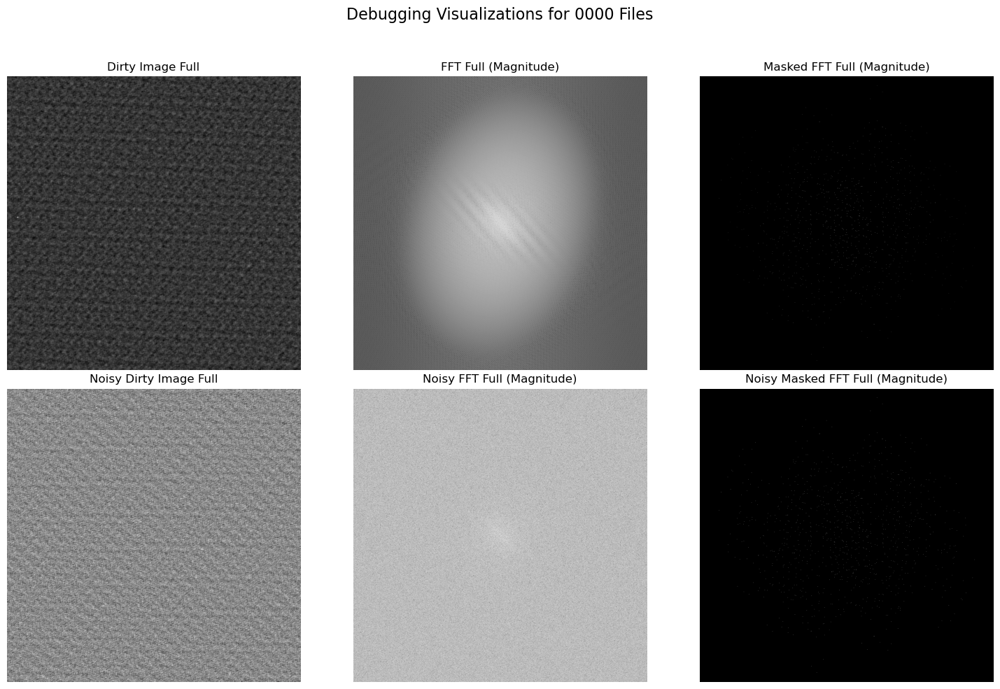

In [42]:
# SANITY CHECK
file_paths = {
    "dirty_image_full": "./synthetic_data/train/freq_2000MHz/antennas_32_s1/0000_dirty_image_full.npy",
    "fft_full": "./synthetic_data/train/freq_2000MHz/antennas_32_s1/0000_fft_full.npy",
    "masked_fft_full": "./synthetic_data/train/freq_2000MHz/antennas_32_s1/0000_masked_fft_full.npy",
    "noisy_dirty_image_full": "./synthetic_data/train/freq_2000MHz/antennas_32_s1/0000_noisy_dirty_image_full.npy",
    "noisy_fft_full": "./synthetic_data/train/freq_2000MHz/antennas_32_s1/0000_noisy_fft_full.npy",
    "noisy_masked_fft_full": "./synthetic_data/train/freq_2000MHz/antennas_32_s1/0000_noisy_masked_fft_full.npy",
}

data = {key: np.load(path) for key, path in file_paths.items()}
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle("Debugging Visualizations for 0000 Files", fontsize=16)

titles = [
    "Dirty Image Full",
    "FFT Full (Magnitude)",
    "Masked FFT Full (Magnitude)",
    "Noisy Dirty Image Full",
    "Noisy FFT Full (Magnitude)",
    "Noisy Masked FFT Full (Magnitude)",
]

for ax, (key, title) in zip(axes.flat, zip(data.keys(), titles)):
    if "fft" in key:
        # For FFT files
        ax.imshow(np.log1p(np.abs(data[key])), cmap="gray", origin="lower")
    else:
        # For image files
        ax.imshow(data[key], cmap="gray", origin="lower")
    ax.set_title(title)
    ax.axis("off")

plt.tight_layout(rect=[0, 0, 1, 0.95])  # Leave space for the suptitle
plt.show()

# Documentation for Synthetic Data Directory Structure

This document explains the structure of the `synthetic_data` directory generated for training and validation datasets. It describes the folder hierarchy, contents, and naming conventions, making it easy for others to navigate and understand the data.

---

## Overview
The `synthetic_data` directory contains training (`train`) and validation (`valid`) datasets for synthetic visibility simulations. Data is organized by:
1. **Dataset type**: Training or validation.
2. **Frequency**: The observing frequency in MHz.
3. **Antenna count**: The number of antennas used for observations.
4. **Scaling factors**: Downscaling factors applied to images and visibilities.

---

## Directory Structure
```
synthetic_data/
├── train/
│   ├── freq_10MHz/
│   │   ├── antennas_16_s1/
│   │   ├── antennas_16_s2/
│   │   ├── antennas_32_s1/
│   │   ├── antennas_32_s2/
│   │   └── ...
│   ├── freq_700MHz/
│   ├── freq_1300MHz/
│   ├── freq_2000MHz/
│   └── ...
├── valid/
│   ├── freq_10MHz/
│   │   ├── antennas_16_s1/
│   │   ├── antennas_16_s2/
│   │   ├── antennas_32_s1/
│   │   ├── antennas_32_s2/
│   │   └── ...
│   ├── freq_700MHz/
│   ├── freq_1300MHz/
│   ├── freq_2000MHz/
│   └── ...
```
---

## Explanation of Directory Components

### 1. **Top-Level Folders**
- `train/`: Contains synthetic data for the training dataset.
- `valid/`: Contains synthetic data for the validation dataset.

### 2. **Frequency Subfolders**
Each dataset (`train` or `valid`) is divided into subfolders by the observing frequency:
- Example: `freq_10MHz`, `freq_700MHz`, `freq_1300MHz`, and `freq_2000MHz`.

These correspond to:
- 10 MHz
- 700 MHz
- 1.3 GHz
- 2 GHz

### 3. **Antenna Subfolders**
Inside each frequency folder, data is divided by the number of antennas and the scaling factor:
- Example: `antennas_16_s1` represents 16 antennas with no downscaling.
- `_s1`: No downscaling applied.
- `_s2`: Downscaled by a factor of 2.

Other examples:
- `antennas_32_s1`: 32 antennas, no downscaling.
- `antennas_2048_s2`: 2048 antennas, downscaled by 2.

---

## File Naming and Contents

Each subfolder (e.g., `antennas_16_s1`) contains six files per image, corresponding to different outputs:

| **File Name**                     | **Description**                                                                 |
|------------------------------------|---------------------------------------------------------------------------------|
| `fft_full.npy`                     | Full observed noise-free visibility (Fourier transform of the true sky).        |
| `masked_fft_full.npy`              | Sampled noise-free visibility (Fourier transform after applying the UV mask).   |
| `dirty_image_full.npy`             | Dirty image reconstructed from sampled noise-free visibility.                   |
| `noisy_fft_full.npy`               | Full observed noisy visibility (Fourier transform of the noisy true sky).       |
| `noisy_masked_fft_full.npy`        | Sampled noisy visibility.                                                      |
| `noisy_dirty_image_full.npy`       | Dirty image reconstructed from sampled noisy visibility.                        |

---

## How to Access Data

### Example: Accessing 16 Antennas at 2 GHz
The folder path:
synthetic_data/train/freq_2000MHz/antennas_16_s1/

Files in this folder:
- `fft_full.npy`: Full noise-free visibility.
- `masked_fft_full.npy`: Masked noise-free visibility.
- `dirty_image_full.npy`: Dirty image from noise-free visibility.
- `noisy_fft_full.npy`: Full noisy visibility.
- `noisy_masked_fft_full.npy`: Masked noisy visibility.
- `noisy_dirty_image_full.npy`: Dirty image from noisy visibility.

### Example: Accessing Validation Data
For 2048 antennas at 700 MHz, the folder path:
```
synthetic_data/valid/freq_700MHz/antennas_2048_s2/
```
---

## Usage Notes

### 1. **Adding New Frequencies or Antennas**
To include additional frequencies or antennas:
1. Add the corresponding frequency or antenna count to the generation script.
2. Regenerate the synthetic data.

### 2. **Zipping Specific Folders**
To zip only a specific frequency and antenna:
```
zip -r output.zip synthetic_data/train/freq_2000MHz/antennas_2048_s1 synthetic_data/valid/freq_2000MHz/antennas_2048_s1
```

---

## FAQ

### 1. **What is `_s1` and `_s2`?**
   - `_s1` refers to data with no downscaling.
   - `_s2` refers to data downscaled by a factor of 2.

### 2. **What is the difference between `fft_full.npy` and `masked_fft_full.npy`?**
   - `fft_full.npy`: Contains the full Fourier transform of the image without any sampling.
   - `masked_fft_full.npy`: Contains the Fourier transform after applying the UV sampling mask.

### 3. **How is the data generated?**
   - Data is generated using Python scripts that process true sky images, apply UV sampling masks, and produce outputs (FFT, masked FFT, dirty images).

### 4. **What tools can I use to view `.npy` files?**
   - Use Python with NumPy:
     ```
     import numpy as np
     data = np.load("path_to_file.npy")
     print(data.shape)
     ```
   - Visualize images using `matplotlib`:
     ```
     import matplotlib.pyplot as plt
     plt.imshow(data, cmap="gray")
     plt.show()
     ```

---

AssertionError: Not in data generation mode. Stopping this cell from wasting your time...